In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import json
from tqdm import tqdm_notebook
from sklearn.metrics import *
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer
import warnings
import time
import string # библиотека для работы со строками
import re
import nltk   # Natural Language Toolkit
import pymorphy2 # Морфологический анализатор
import gensim.corpora as corpora
import gensim
from pprint import pprint
import seaborn as sns
import matplotlib.colors as mcolors
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from collections import Counter
from matplotlib.patches import Rectangle
from matplotlib.ticker import FuncFormatter
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
%matplotlib inline
warnings.filterwarnings("ignore") 

In [2]:
texts = open('text_lemmatized_all.txt', encoding = 'utf-8').readlines()

In [3]:
len(texts)

264759

In [4]:
texts[:2]

['правосудие искать виновный вместо искать правда переставать закрыть глаз представить задыхаться несправедливость ложь прислушаться смочь услышать крик боль издавать вдохнуть воздух пропитать кровь смерть любить сильный фильм тяжёлый сюжет затрагивать аспект наш жизнь показывать несовершенство покорить тёмный рыцарь нолан показать наш прогнить система город готэма один отводить наш жизнь вымышленность давать вернуться реальность посмотреть судебный система американский правосудие являться эталон зал суд выглядеть арена цирк клоун адвокат прокурор выискиваться присяжный человек должный беспристрастный являться человек давать посмотреть страна двести устроить гражданский война прикрытие лозунг свобода раб освободить плантация господин предоставить свобода белый человек дать концепция пропитать фильм убивать показывать отношение чёрный план правосудие показывать проблема целиком глубокий различие цвет кожа сценарий фильм служить эталон сегодняшний голливуд штамповать поп корновое фильм с

In [5]:
# stop_words = ['фильм', 'кино', 'герой', 'какой', 'такой', 'который', 'первый', 'новый', 'свой', 'актёр', 'история',
#              'самый', 'сцена', 'хороший', 'человек', 'картина', 'наш', 'один']

In [6]:
stop_words = ['фильм', 'кино', 'какой', 'такой', 'который', 'первый', 'новый', 'свой', 'актёр', 'самый', 'сцена', 'хороший', 'человек', 'картина']

In [7]:
word_tokenizer = nltk.WordPunctTokenizer()

In [8]:
texts1 = []

for x in tqdm_notebook(texts):
    tokens     = word_tokenizer.tokenize(x)
    tokens = [word for word in tokens if (word not in stop_words)]
    texts1.append(tokens)

  0%|          | 0/264759 [00:00<?, ?it/s]

In [9]:
# texts1 = texts1[:10000]

In [10]:
%%time
from gensim.models.ldamulticore import LdaMulticore
id2word = corpora.Dictionary(texts1)

# Create Corpus: Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts1]

# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=4, 
                                           random_state=100,
                                           chunksize=10,
                                           passes=10,
                                           alpha='symmetric',
                                           iterations=100,
                                           per_word_topics=True,
                                               workers=6)

pprint(lda_model.print_topics())

[(0,
  '0.008*"роль" + 0.006*"герой" + 0.006*"любовь" + 0.005*"история" + '
  '0.005*"игра" + 0.005*"сюжет" + 0.005*"книга" + 0.005*"просмотр" + '
  '0.005*"понравиться" + 0.004*"главный"'),
 (1,
  '0.009*"сюжет" + 0.007*"персонаж" + 0.007*"герой" + 0.005*"игра" + '
  '0.005*"часть" + 0.004*"роль" + 0.004*"зритель" + 0.004*"получиться" + '
  '0.004*"интересный" + 0.004*"просмотр"'),
 (2,
  '0.007*"герой" + 0.006*"зритель" + 0.006*"история" + 0.005*"жизнь" + '
  '0.005*"режиссёр" + 0.003*"образ" + 0.003*"один" + 0.002*"сторона" + '
  '0.002*"являться" + 0.002*"происходить"'),
 (3,
  '0.005*"герой" + 0.004*"знать" + 0.003*"хотеть" + 0.003*"русский" + '
  '0.003*"один" + 0.003*"ребёнок" + 0.003*"смотреть" + 0.003*"плохой" + '
  '0.002*"комедия" + 0.002*"показать"')]
Wall time: 4h 27min 48s


В первом топике наиболее популярные словами являются: роль, любовь, герой, история. Можно сказать, что в таких рецензиях важна интересная история в сюжете фильма, поведение человека. Чаще всего любовная история, но не обязательно. Возможно в таких фильмах поднимаются какие-то философские темы. Таким образом, тема данного топика - фильмы с глубоким смыслом / жизненные истории в фильмах.

Во втором топике похожая ситуация, так как наиболее часто встречающиеся слова: сюжет, герой, персонаж, интересный, роль. Но все же, в данных типах рецензий на первом плане сюжет и герой/персонаж, и скорее всего их место в сюжете фильме. Поэтому, данную тему можно назвать: актер + сюжет.

Третий топик является самым неоднозначным для оценки, так как здесь частыми словами являются: герой, жизнь, зритель, режиссёр, история. Можно сказать, что такие рецензии пишут на фильмы известных режиссёров, а так же важна история и герои в сюжете. Название данной темы: фильмы известных режиссёров.

Третий топик получился наиболее однозначным, так как здесь популярные слова: герой, русский, комедия, плохой. Очевидно, что данные рецензии написаны на российские фильмы, зачастую комедии, и не все из них являются хорошими. Название топика - российские фильмы.

In [11]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=texts1):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=texts1)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,2.0,0.7289,"герой, зритель, история, жизнь, режиссёр, обра...","[правосудие, искать, виновный, вместо, искать,..."
1,1,1.0,0.6691,"сюжет, персонаж, герой, игра, часть, роль, зри...","[вспомнить, прощать, честно, говорить, весь, т..."
2,2,0.0,0.7569,"роль, герой, любовь, история, игра, сюжет, кни...","[начитаться, отзыв, загореться, смотреть, наде..."
3,3,0.0,0.6588,"роль, герой, любовь, история, игра, сюжет, кни...","[безусловно, провалиться, предречь, канны, лад..."
4,4,2.0,0.7357,"герой, зритель, история, жизнь, режиссёр, обра...","[любить, история, любить, чёрный, юмор, элемен..."
5,5,0.0,0.4256,"роль, герой, любовь, история, игра, сюжет, кни...","[честно, судить, признаться, воспринимать, экр..."
6,6,3.0,0.4434,"герой, знать, хотеть, русский, один, ребёнок, ...","[собственно, кинотеатр, зал, выйти, отличный, ..."
7,7,3.0,0.4994,"герой, знать, хотеть, русский, один, ребёнок, ...","[смело, заявлять, просмотр, недоработать, силь..."
8,8,1.0,0.5322,"сюжет, персонаж, герой, игра, часть, роль, зри...","[читать, одноимённый, книга, точнее, серия, кн..."
9,9,2.0,0.4071,"герой, зритель, история, жизнь, режиссёр, обра...","[мелькать, мысль, просмотр, данный, клинт, ист..."


<AxesSubplot:xlabel='Dominant_Topic'>

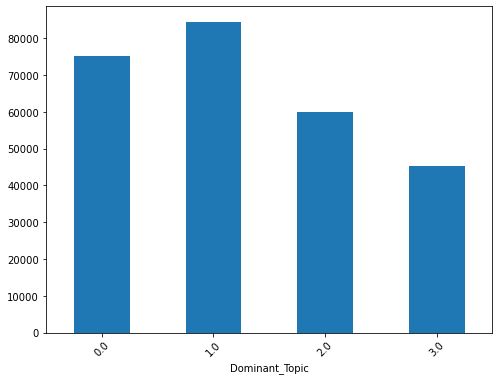

In [12]:
df_dominant_topic.groupby('Dominant_Topic').size().plot(kind='bar', rot=45, figsize=(8, 6))

в данном случае количество документов по топикам выровнялось

In [13]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

# Show
sent_topics_sorteddf_mallet.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0.0,0.9972,"роль, герой, любовь, история, игра, сюжет, книга, просмотр, понравиться, главный","[ждать, возлагать, больший, надежда, сильно, ждать, разочаровывать, смело, гордо, капля, разочар..."
1,1.0,0.9965,"сюжет, персонаж, герой, игра, часть, роль, зритель, получиться, интересный, просмотр","[ох, критика, начать, просмотр, оказаться, завысить, ожидание, просмотр, каждый, часть, оценка, ..."
2,2.0,0.9980,"герой, зритель, история, жизнь, режиссёр, образ, один, сторона, являться, происходить","[создатель, приводить, сенсационный, факт, пущий, доказательство, порочность, нынешний, система,..."
3,3.0,0.9949,"герой, знать, хотеть, русский, один, ребёнок, смотреть, плохой, комедия, показать","[извинить, бред, ожидать, михалков, реально, завязывать, кинематограф, просмотр, сие, шедевр, па..."


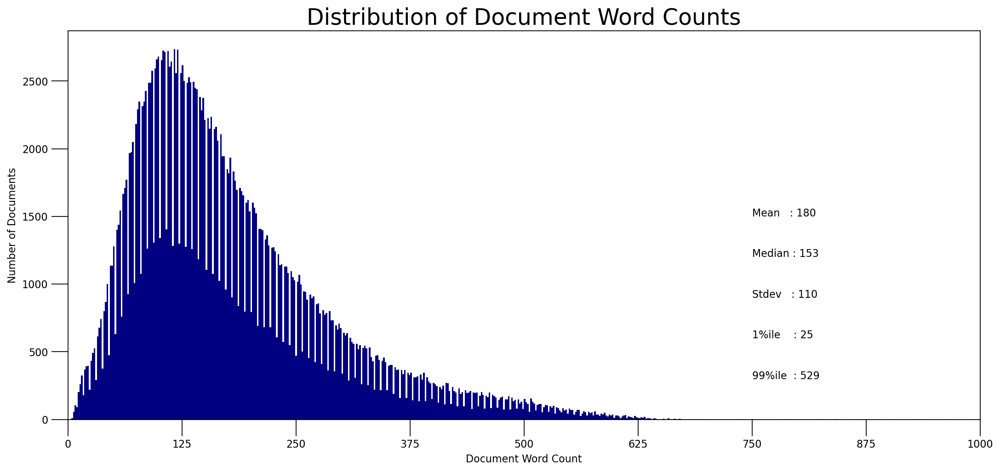

In [14]:
doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(16,7), dpi=160)
plt.hist(doc_lens, bins = 1000, color='navy')
plt.text(750, 1500, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(750, 1200, "Median : " + str(round(np.median(doc_lens))))
plt.text(750,  900, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(750,  600, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(750,  300, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 1000), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,1000,9))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=22))
plt.show()

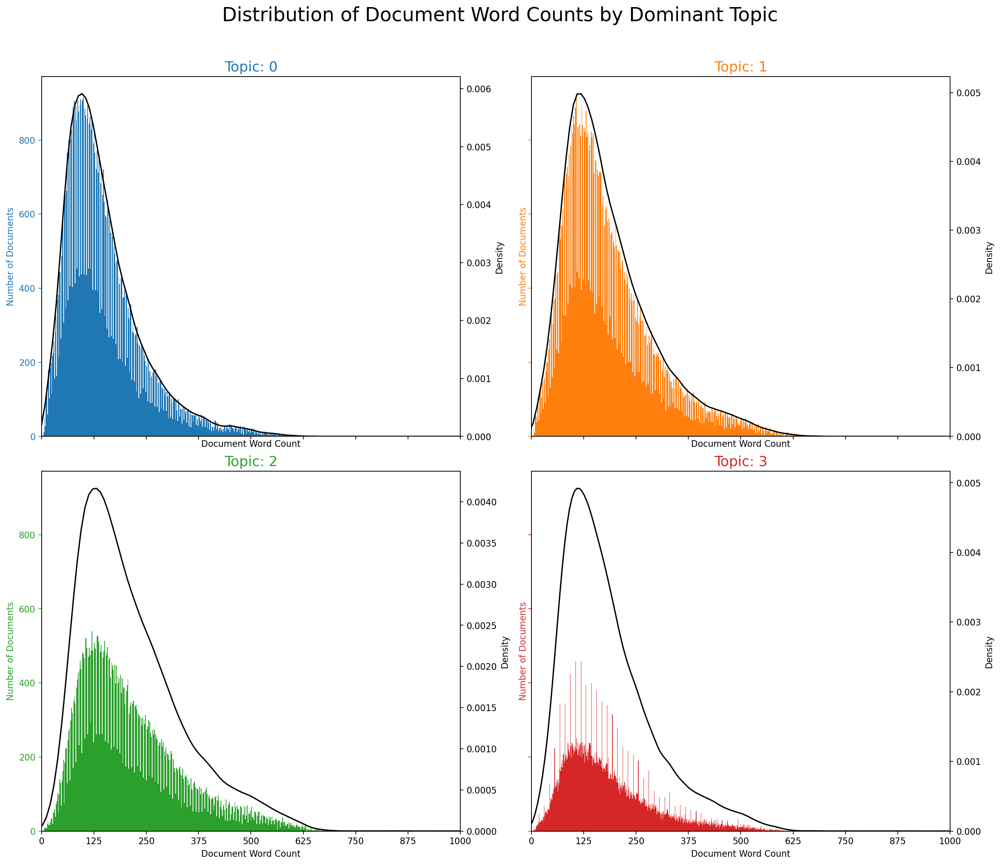

In [15]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

fig, axes = plt.subplots(2,2,figsize=(16,14), dpi=160, sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):    
    df_dominant_topic_sub = df_dominant_topic.loc[df_dominant_topic.Dominant_Topic == i, :]
    doc_lens = [len(d) for d in df_dominant_topic_sub.Text]
    ax.hist(doc_lens, bins = 1000, color=cols[i])
    ax.tick_params(axis='y', labelcolor=cols[i], color=cols[i])
    sns.kdeplot(doc_lens, color="black", shade=False, ax=ax.twinx())
    ax.set(xlim=(0, 1000), xlabel='Document Word Count')
    ax.set_ylabel('Number of Documents', color=cols[i])
    ax.set_title('Topic: '+str(i), fontdict=dict(size=16, color=cols[i]))

fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.xticks(np.linspace(0,1000,9))
fig.suptitle('Distribution of Document Word Counts by Dominant Topic', fontsize=22)
plt.show()

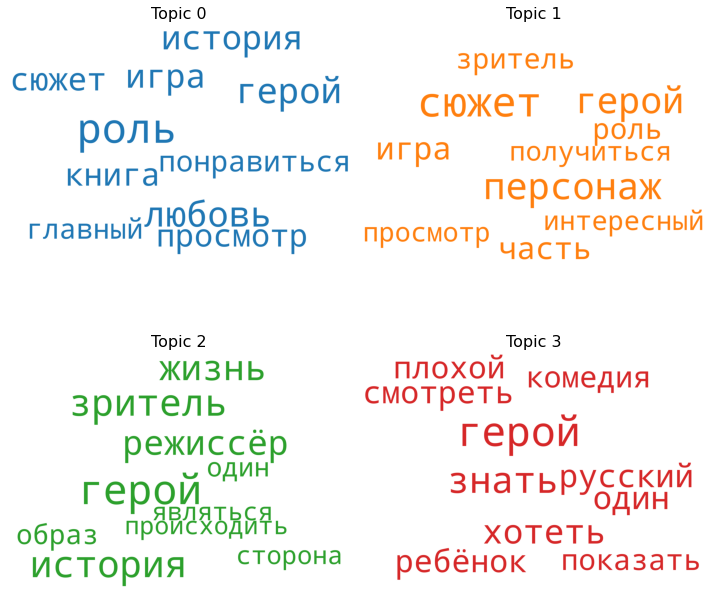

In [16]:
# 1. Wordcloud of Top N words in each topic
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

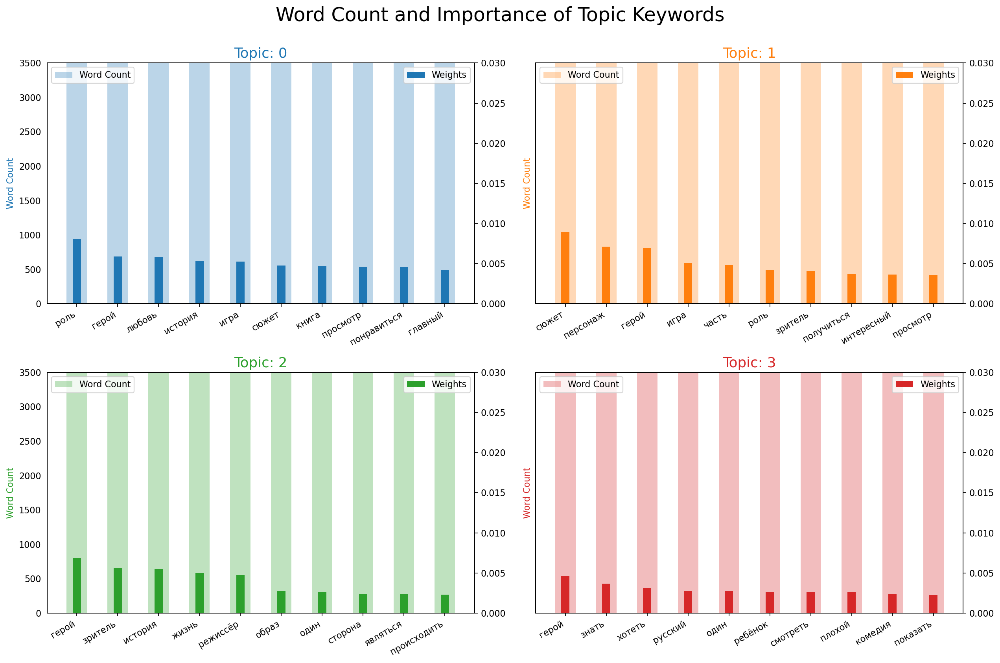

In [17]:
topics = lda_model.show_topics(formatted=False)
data_flat = [w for w_list in texts1 for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(2, 2, figsize=(16,10), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)    
plt.show()

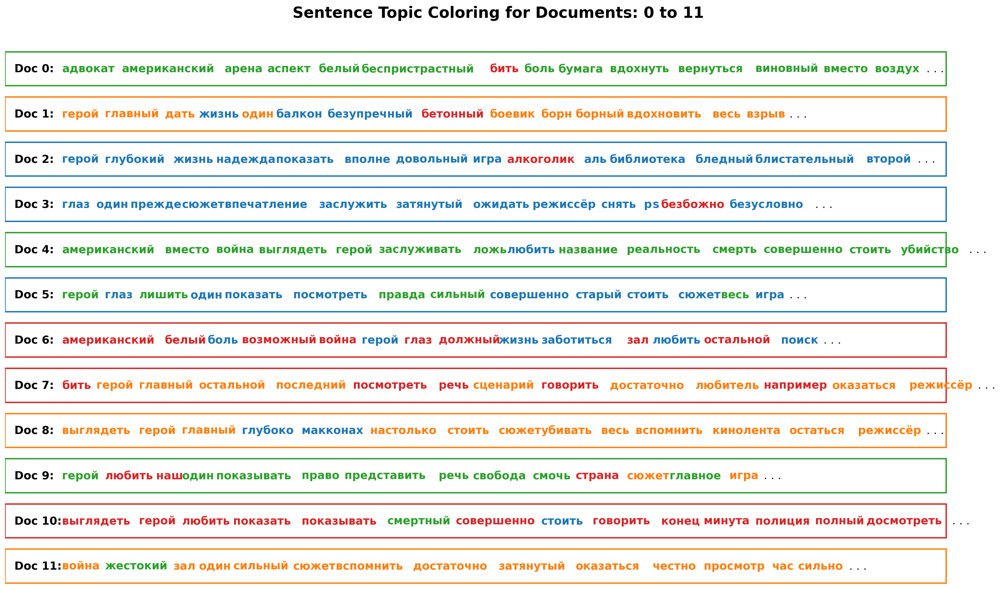

In [18]:
# Sentence Coloring of N Sentences
def sentences_chart(lda_model=lda_model, corpus=corpus, start = 0, end = 13):
    corp = corpus[start:end]
    mycolors = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    fig, axes = plt.subplots(end-start, 1, figsize=(20, (end-start)*0.95), dpi=160)       
    axes[0].axis('off')
    for i, ax in enumerate(axes):
        if i > 0:
            corp_cur = corp[i-1] 
            topic_percs, wordid_topics, wordid_phivalues = lda_model[corp_cur]
            word_dominanttopic = []
            try:
                for wd, topic in wordid_topics:
                    word_dominanttopic.append((lda_model.id2word[wd], topic[0]))
            except:
                pass 
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            # Draw Rectange
            topic_percs_sorted = sorted(topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.05), 0.99, 0.90, fill=None, alpha=1, 
                                   color=mycolors[topic_percs_sorted[0][0]], linewidth=2))

            word_pos = 0.06
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 14:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=16, color=mycolors[topics],
                            transform=ax.transAxes, fontweight=700)
                    word_pos += .009 * len(word)  # to move the word for the next iter
                    ax.axis('off')
            ax.text(word_pos, 0.5, '. . .',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=16, color='black',
                    transform=ax.transAxes)  

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) + ' to ' + str(end-2), fontsize=22, y=0.95, fontweight=700)
    plt.tight_layout()
    plt.show()

sentences_chart() 

In [19]:
# Sentence Coloring of N Sentences
def topics_per_document(model, corpus, start=0, end=1):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=lda_model, corpus=corpus, end=-1)            

# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# Total Topic Distribution by actual weight
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in lda_model.show_topics(formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)

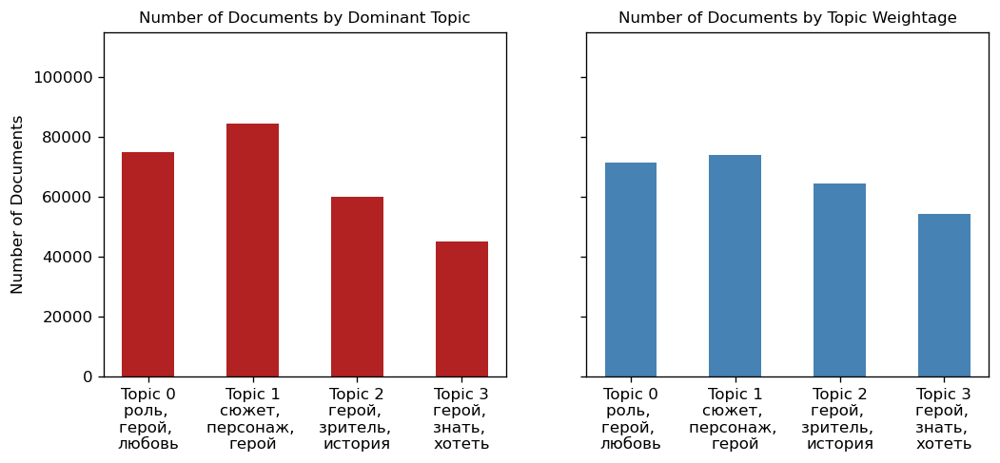

In [20]:
# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=120, sharey=True)

# Topic Distribution by Dominant Topics
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc, width=.5, color='firebrick')
ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x)+ '\n' + df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])
ax1.xaxis.set_major_formatter(tick_formatter)
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))
ax1.set_ylabel('Number of Documents')
ax1.set_ylim(0, 115000)

# Topic Distribution by Topic Weights
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc, width=.5, color='steelblue')
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.xaxis.set_major_formatter(tick_formatter)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

plt.show()

In [21]:
# Get topic weights and dominant topics ------------
# Get topic weights
from bokeh.resources import INLINE
import bokeh.io

topic_weights = []
for i, row_list in enumerate(lda_model[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
bokeh.io.output_notebook(INLINE)
n_topics = 4
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 258819 samples in 2.848s...
[t-SNE] Computed neighbors for 258819 samples in 19.973s...
[t-SNE] Computed conditional probabilities for sample 1000 / 258819
[t-SNE] Computed conditional probabilities for sample 2000 / 258819
[t-SNE] Computed conditional probabilities for sample 3000 / 258819
[t-SNE] Computed conditional probabilities for sample 4000 / 258819
[t-SNE] Computed conditional probabilities for sample 5000 / 258819
[t-SNE] Computed conditional probabilities for sample 6000 / 258819
[t-SNE] Computed conditional probabilities for sample 7000 / 258819
[t-SNE] Computed conditional probabilities for sample 8000 / 258819
[t-SNE] Computed conditional probabilities for sample 9000 / 258819
[t-SNE] Computed conditional probabilities for sample 10000 / 258819
[t-SNE] Computed conditional probabilities for sample 11000 / 258819
[t-SNE] Computed conditional probabilities for sample 12000 / 258819
[t-SNE] Computed conditional probab

[t-SNE] Computed conditional probabilities for sample 120000 / 258819
[t-SNE] Computed conditional probabilities for sample 121000 / 258819
[t-SNE] Computed conditional probabilities for sample 122000 / 258819
[t-SNE] Computed conditional probabilities for sample 123000 / 258819
[t-SNE] Computed conditional probabilities for sample 124000 / 258819
[t-SNE] Computed conditional probabilities for sample 125000 / 258819
[t-SNE] Computed conditional probabilities for sample 126000 / 258819
[t-SNE] Computed conditional probabilities for sample 127000 / 258819
[t-SNE] Computed conditional probabilities for sample 128000 / 258819
[t-SNE] Computed conditional probabilities for sample 129000 / 258819
[t-SNE] Computed conditional probabilities for sample 130000 / 258819
[t-SNE] Computed conditional probabilities for sample 131000 / 258819
[t-SNE] Computed conditional probabilities for sample 132000 / 258819
[t-SNE] Computed conditional probabilities for sample 133000 / 258819
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 238000 / 258819
[t-SNE] Computed conditional probabilities for sample 239000 / 258819
[t-SNE] Computed conditional probabilities for sample 240000 / 258819
[t-SNE] Computed conditional probabilities for sample 241000 / 258819
[t-SNE] Computed conditional probabilities for sample 242000 / 258819
[t-SNE] Computed conditional probabilities for sample 243000 / 258819
[t-SNE] Computed conditional probabilities for sample 244000 / 258819
[t-SNE] Computed conditional probabilities for sample 245000 / 258819
[t-SNE] Computed conditional probabilities for sample 246000 / 258819
[t-SNE] Computed conditional probabilities for sample 247000 / 258819
[t-SNE] Computed conditional probabilities for sample 248000 / 258819
[t-SNE] Computed conditional probabilities for sample 249000 / 258819
[t-SNE] Computed conditional probabilities for sample 250000 / 258819
[t-SNE] Computed conditional probabilities for sample 251000 / 258819
[t-SNE] Computed con

Loading BokehJS ...

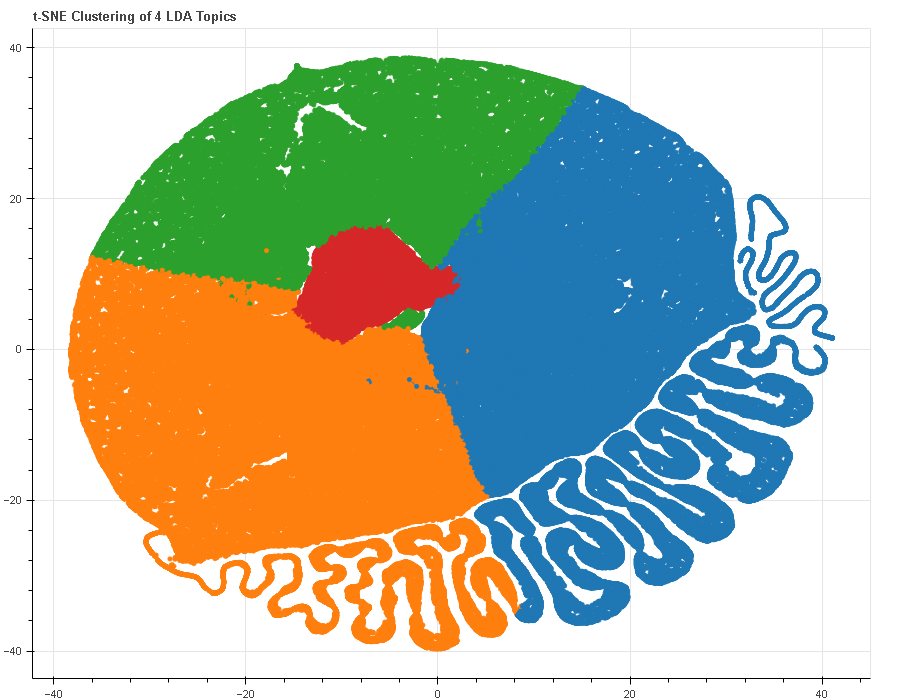

In [22]:
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, dictionary=lda_model.id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.075006  0.096363       1        1  28.319414
2     -0.050232 -0.153476       2        1  27.486007
0     -0.047232  0.047027       3        1  23.345548
3      0.172471  0.010086       4        1  20.849030, topic_info=         Term           Freq          Total Category  logprob  loglift
244      роль  159724.000000  159724.000000  Default  30.0000  30.0000
715    любовь   87912.000000   87912.000000  Default  29.0000  29.0000
340     книга   57815.000000   57815.000000  Default  28.0000  28.0000
138     сюжет  203266.000000  203266.000000  Default  27.0000  27.0000
41      жизнь  110964.000000  110964.000000  Default  26.0000  26.0000
..        ...            ...            ...      ...      ...      ...
207     конец   18682.500510   89009.612944   Topic4  -6.2761   0.0067
246     снять   16331.024715   53042.410818   Topic4  -6.4106   0.3898
243  режиссёр   19641.979672  153207.339144   Topic4  -6.2260  -0.4863
138     сюжет   19099.324117  203266.753492   Topic4  -6.2540  -0.7970
198    играть   16520.697201   82574.738474   Topic4  -6.3991  -0.0412

[387 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
7517       1  0.999721           dc
7519       1  0.999921       marvel
19305      3  0.999646          you
2569       2  0.999397  абстрактный
7001       1  0.996850       аватар
...      ...       ...          ...
153        1  0.376994     являться
153        2  0.463202     являться
153        3  0.159759     являться
153        4  0.000045     являться
11276      4  0.999797         ёлка

[783 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 3, 1, 4])

In [23]:
pyLDAvis.save_html(vis, 'lda.html')